Download Dataset

In [ ]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2023-04-01 08:37:32--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.62.161.112, 2600:1408:c400:168a::317f, 2600:1408:c400:1680::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.62.161.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  80.1MB/s    in 11s     

2023-04-01 08:37:43 (72.7 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



Unzip the Dataset


In [ ]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

# New Section

[link text](`https://`)

# Import Modules


In [ ]:
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install -q keras

In [ ]:
!pip install matplotlib-venn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!apt-get -qq install -y libfluidsynth1

E: Package 'libfluidsynth1' has no installation candidate


In [ ]:
# https://pypi.python.org/pypi/libarchive
!apt-get -qq install -y libarchive-dev && pip install -U libarchive
import libarchive

Selecting previously unselected package libarchive-dev:amd64.
(Reading database ... 128288 files and directories currently installed.)
Preparing to unpack .../libarchive-dev_3.4.0-2ubuntu1.2_amd64.deb ...
Unpacking libarchive-dev:amd64 (3.4.0-2ubuntu1.2) ...
Setting up libarchive-dev:amd64 (3.4.0-2ubuntu1.2) ...
Processing triggers for man-db (2.9.1-1) ...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 KB 5.7 MB/s eta 0:00:00
  Created wheel for libarchive: filename=libarchive-0.4.7-py3-none-any.whl size=31644 sha256=8162962fcb7b96ca25122cff67e19b60e9620eed9975e3670086bb4171af59c9
  Stored in directory: /root/.cache/pip/wheels/c9/a5/cc/cb20f1314d4cdec0001fd72baa1efe93e1542a81bdea2fc639
Successfully built libarchive


In [ ]:
# https://pypi.python.org/pypi/pydot
!apt-get -qq install -y graphviz && pip install pydot
import pydot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install cartopy
import cartopy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 64.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 KB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 85.3 MB/s eta 0:00:00
  Created wheel for cartopy: filename=Cartopy-0.21.1-cp39-cp39-linux_x86_64.whl size=11113621 sha256=26081c04d181d68090fbdd7a87b1ae654dae3849b213fb3b95afa6a3172e312d
  Stored in directory: /root/.cache/pip/wheels/74/b9/f5/2c94acd7cd21480e6cf63169144d7aac3e8d9cf638225ed578
Successfully built cartopy


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from tensorflow.keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

# create Dataframe for Input and Ouput

In [ ]:
input_path=[]
label=[]

for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name== 'Cat':
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join("PetImages",class_name,path))
print(input_path[0],label[0])

PetImages/Cat/1250.jpg 0


In [ ]:
print(input_path[10],label[10])

PetImages/Cat/622.jpg 0


In [ ]:
print(len(label))
print(len(input_path))

25002
25002


In [ ]:
df=pd.DataFrame()
df['images']=input_path
df['label']=label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Dog/3917.jpg,1
1,PetImages/Dog/12343.jpg,1
2,PetImages/Dog/11951.jpg,1
3,PetImages/Dog/11901.jpg,1
4,PetImages/Dog/9539.jpg,1


In [ ]:
# delete db files
for i in df['images']:
  if '.jpg' not in i:
    print(i)


PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [ ]:
import PIL # here test which image is not loading properly..
l=[]
for image in df['images']:
  try:
    img=PIL.Image.open(image)
  except:
    l.append(image)
l


['PetImages/Dog/11702.jpg', 'PetImages/Cat/666.jpg']

In [ ]:
# delete db files
df=df[df['images']!='PetImages/Dog/Thumbs.db']
df=df[df['images']!='PetImages/Cat/Thumbs.db']
df=df[df['images']!='PetImages/Dog/11702.jpg']
df=df[df['images']!='PetImages/Cat/666.jpg']
len(df)

24998

## Exploratory Data Analysis

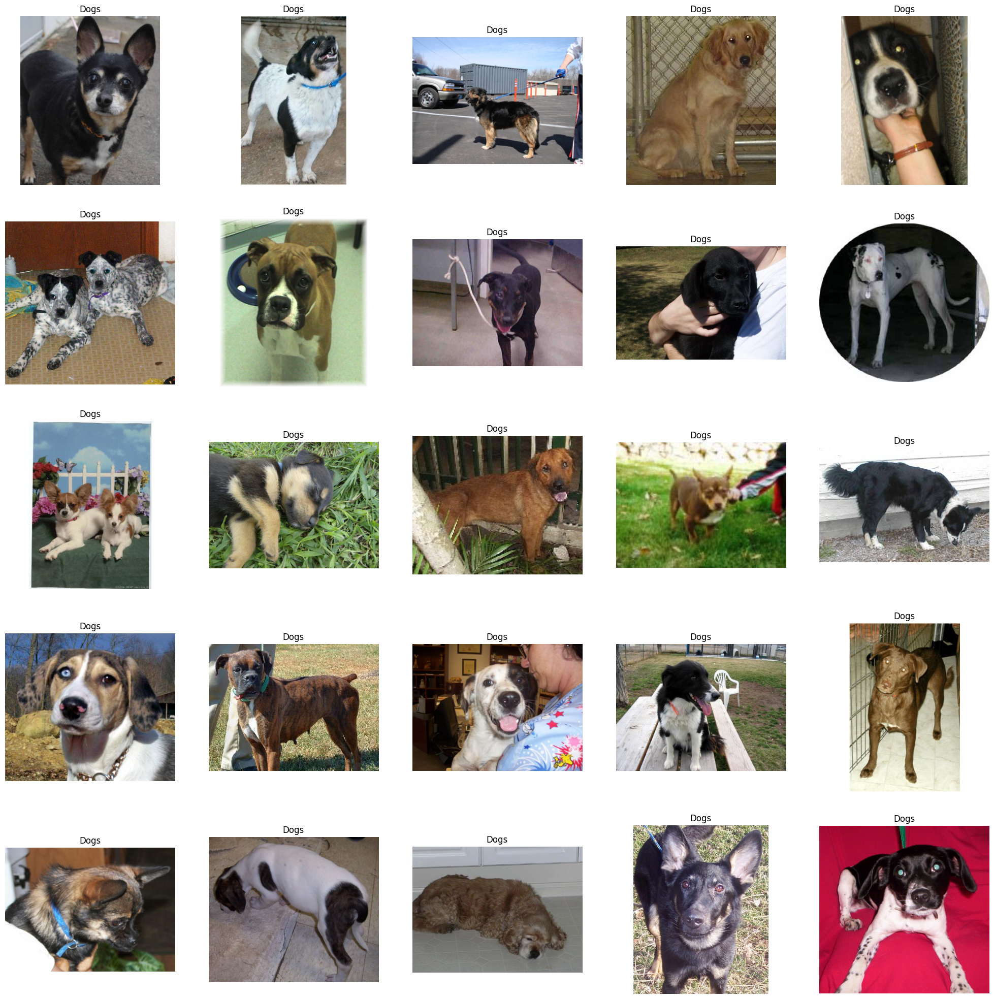

In [ ]:
# to display grid of images
plt.figure(figsize=(25,25))
temp=df[df['label']==1]['images']
start = random.randint(0,len(temp))
files=temp[start:start+25]

for index, file in enumerate(files):  # enumerate take a tuple.ex: x = ('apple', 'banana', 'cherry') ----> y = enumerate(x) ----> print(list(y)) ---> [(0, 'apple'), (1, 'banana'), (2, 'cherry')]
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img= np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')

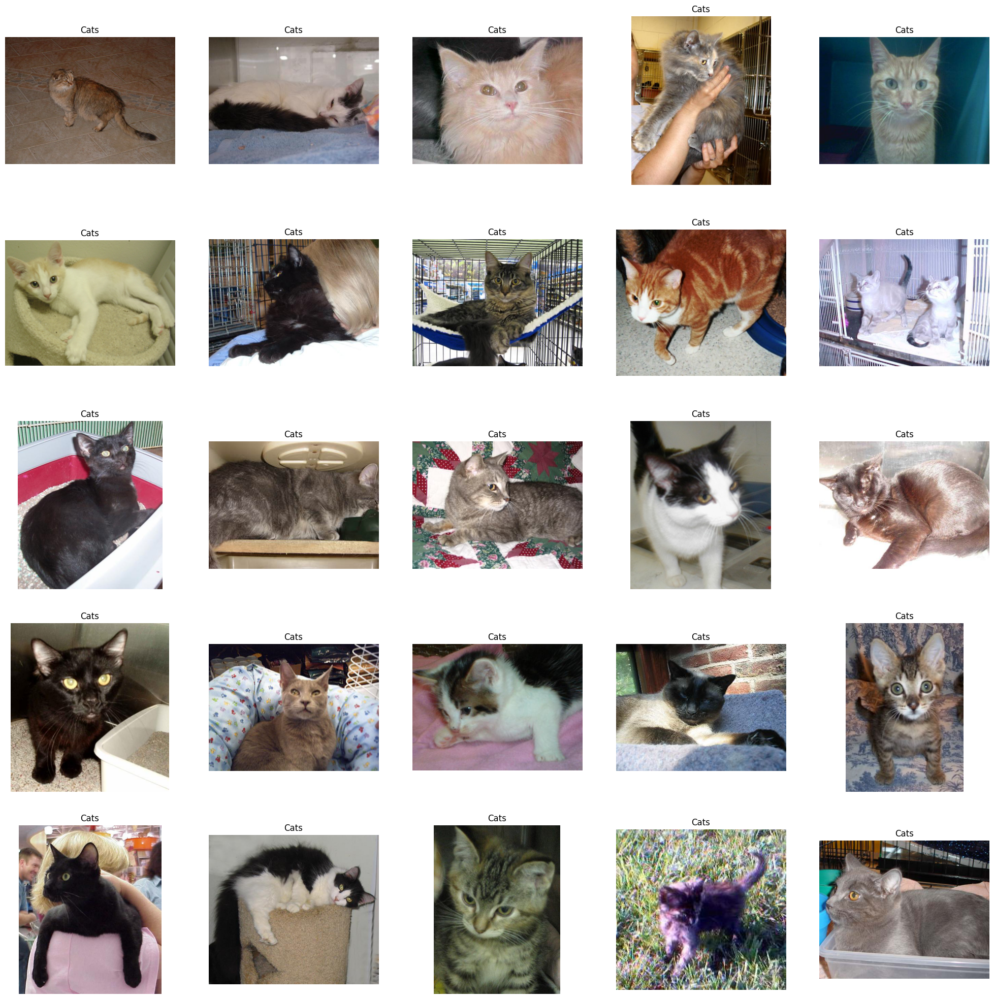

In [ ]:
# to display grid of images
plt.figure(figsize=(25,25))
temp=df[df['label']==0]['images']
start = random.randint(0,len(temp))
files=temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img= np.array(img)
  plt.imshow(img)
  plt.title('Cats')
  plt.axis('off')

<Axes: ylabel='count'>

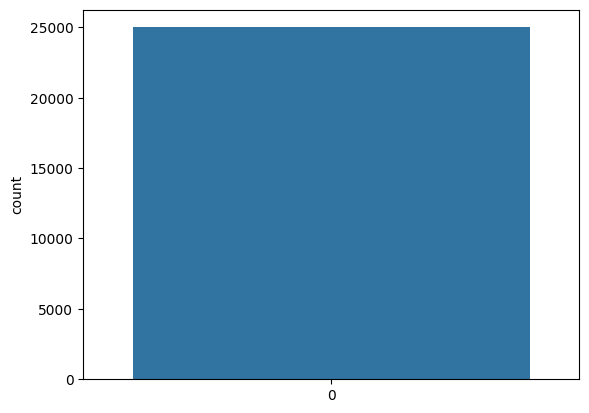

In [ ]:
import seaborn
seaborn.countplot(df['label'])

## create DataGenerator for the images

In [ ]:
df['label']=df['label'].astype('str')

In [ ]:
df.head()

,images,label
0,PetImages/Dog/3917.jpg,1
1,PetImages/Dog/12343.jpg,1
2,PetImages/Dog/11951.jpg,1
3,PetImages/Dog/11901.jpg,1
4,PetImages/Dog/9539.jpg,1


In [ ]:
#input split
from sklearn.model_selection import train_test_split
train,test=train_test_split(df,test_size=0.2, random_state=42)

In [ ]:
train.head()

,images,label
23290,PetImages/Dog/7178.jpg,1
17783,PetImages/Dog/1904.jpg,1
1020,PetImages/Dog/2074.jpg,1
12646,PetImages/Cat/4421.jpg,0
1533,PetImages/Cat/5706.jpg,0


In [ ]:
test.head()

,images,label
6868,PetImages/Cat/8275.jpg,0
22913,PetImages/Cat/4322.jpg,0
9670,PetImages/Cat/5658.jpg,0
13640,PetImages/Cat/295.jpg,0
23341,PetImages/Cat/7824.jpg,0


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_generator= ImageDataGenerator(
    rescale = 1./255, # nomalization of images..
    rotation_range=40, # augmentation of images to avoid overfiting
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_generator = ImageDataGenerator(rescale=1./255)

train_iterator=train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
    )

val_iterator=val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128), # for higher resolution it can be 256 or 299 also...
    batch_size=512,
    class_mode='binary'
    )

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


# Model Creation


In [ ]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
    Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(64,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),    # convert 2d array to single dimensional array..
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')

])

In [ ]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 63, 63, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 14, 14, 64)      

In [ ]:
history=model.fit(train_iterator,epochs=10,validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 677s 17s/step - loss: 0.6792 - accuracy: 0.5639 - val_loss: 0.6386 - val_accuracy: 0.6602
Epoch 2/10
40/40 [==============================] - 550s 14s/step - loss: 0.6205 - accuracy: 0.6572 - val_loss: 0.5886 - val_accuracy: 0.6894
Epoch 3/10
40/40 [==============================] - 589s 15s/step - loss: 0.5797 - accuracy: 0.6931 - val_loss: 0.5731 - val_accuracy: 0.6992
Epoch 4/10
40/40 [==============================] - 553s 14s/step - loss: 0.5587 - accuracy: 0.7151 - val_loss: 0.5989 - val_accuracy: 0.6534
Epoch 5/10
40/40 [==============================] - 598s 15s/step - loss: 0.5522 - accuracy: 0.7169 - val_loss: 0.5292 - val_accuracy: 0.7370
Epoch 6/10
40/40 [==============================] - 598s 15s/step - loss: 0.5126 - accuracy: 0.7460 - val_loss: 0.4929 - val_accuracy: 0.7658
Epoch 7/10
40/40 [==============================] - 590s 15s/step - loss: 0.4947 - accuracy: 0.7570 - val_loss: 0.4801 - val_accuracy: 0.7744
Epoch 

Visualization of Result

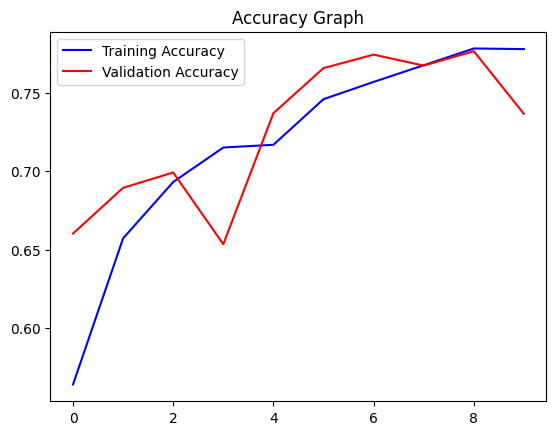

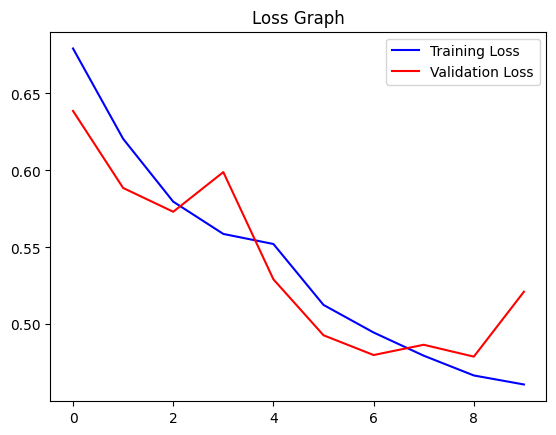

In [ ]:
acc = history.history['accuracy']
val_acc=history.history['val_accuracy']
epochs=range(len(acc))

plt.plot(epochs,acc,'b',label='Training Accuracy')
plt.plot(epochs,val_acc,'r',label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()   # show corresponding color and level..
plt.figure()

loss=history.history['loss']
val_loss=history.history['val_loss']
plt.plot(epochs,loss,'b',label='Training Loss')
plt.plot(epochs,val_loss,'r',label='Validation Loss')
plt.title('Loss Graph')
plt.legend()   # show corresponding color and level..
plt.show()

